In [1]:
install.packages("dslabs")

package 'dslabs' successfully unpacked and MD5 sums checked

The downloaded binary packages are in
	C:\Users\asus\AppData\Local\Temp\RtmpMJZ4Mw\downloaded_packages


In [2]:
library(dslabs)

Warning message:
"package 'dslabs' was built under R version 3.6.3"

In [3]:
help(dslabs)

In [4]:
'??dslabs'

[1] "??dslabs"

In [6]:
data(heights)
heights
class(heights)

sex,height
Male,75
Male,70
Male,68
Male,74
Male,61
Female,65
Female,66
Female,62
Female,66
Male,67


[1] "data.frame"

In [8]:
nrow(heights)


[1] 1050

In [10]:
heights[777,]

,sex,height
777,Female,61


In [11]:
heights$sex[777]

[1] Female
Levels: Female Male

In [12]:
heights[777, 1]

[1] Female
Levels: Female Male

In [13]:
heights[1, 777]

NULL

In [14]:
max(heights)

ERROR: Error in FUN(X[[i]], ...): only defined on a data frame with all numeric variables


In [15]:
heights.max[1]

ERROR: Error in eval(expr, envir, enclos): object 'heights.max' not found


In [16]:
max(heights$height)

[1] 82.67717

In [18]:
heights[which.min(heights$height),]

,sex,height
1032,Male,50


In [19]:
mean(heights$height)

[1] 68.32301

In [20]:
median(heights$height)

[1] 68.5

In [24]:
library("dplyr")
total_male <- nrow(dplyr::filter(heights, sex %in% "Male"))
total_male

[1] 812

In [28]:
# wrong (I found the percentage, not proportion)
percent_male <- (total_male / nrow(heights)) * 100 
percent_male

[1] 0.7733333

In [27]:
# corret - What proportion of individuals in the dataset are male?
mean(heights$sex == "Male")

[1] 0.7733333

In [44]:
# How many individuals are taller than 78 inches (roughly 2 meters)?
all_tall <- subset(heights, height > 78)
all_tall


individuals <- nrow(subset(heights, height > 78))
individuals


,sex,height
98,Female,78.74016
253,Male,80.00000
281,Male,80.00000
377,Male,79.05000
533,Male,79.00000
917,Male,78.74000
983,Female,79.00000
993,Male,81.00000
1017,Male,82.67717


[1] 9

Registered S3 methods overwritten by 'ggplot2':
  method         from 
  [.quosures     rlang
  c.quosures     rlang
  print.quosures rlang
Registered S3 method overwritten by 'rvest':
  method            from
  read_xml.response xml2
-- Attaching packages --------------------------------------- tidyverse 1.2.1 --
v ggplot2 3.1.1     v readr   1.3.1
v tibble  2.1.1     v purrr   0.3.2
v tidyr   0.8.3     v stringr 1.4.0
v ggplot2 3.1.1     v forcats 0.4.0
-- Conflicts ------------------------------------------ tidyverse_conflicts() --
x dplyr::filter() masks stats::filter()
x dplyr::lag()    masks stats::lag()
Loading required package: lattice

Attaching package: 'caret'

The following object is masked from 'package:purrr':

    lift

Warning message in set.seed(2, sample.kind = "Rounding"):
"non-uniform 'Rounding' sampler used"

[1] 0.5238095

sex,mean(height),sd(height)
Female,64.93942,3.760656
Male,69.31475,3.611024


[1] 0.7933333

[1] 0.8361905

[1] 64

[1] 0.8171429

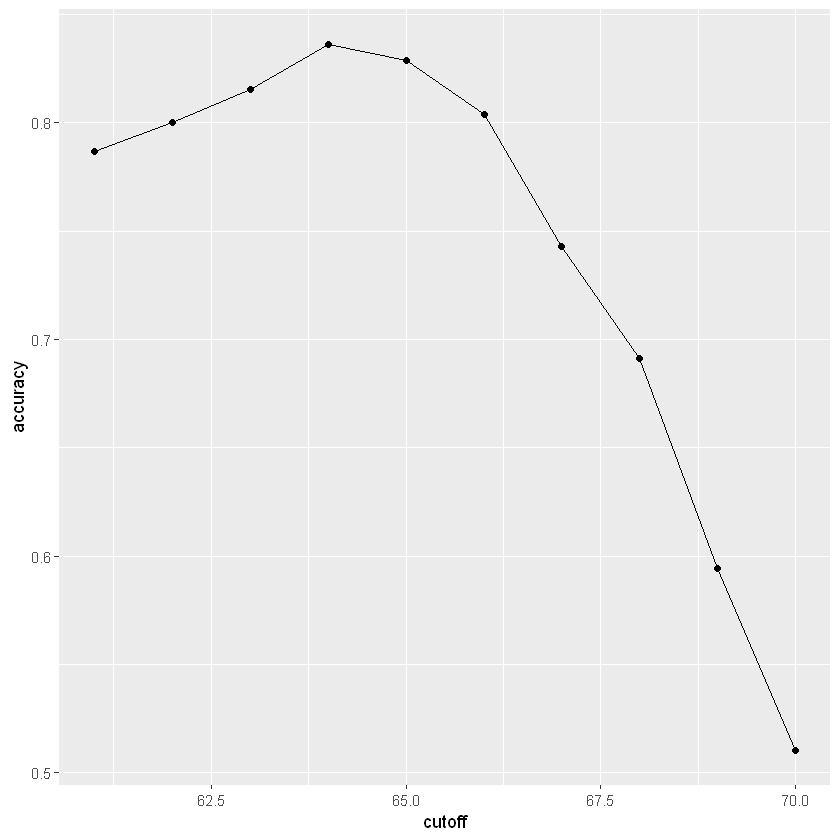

In [45]:
library(tidyverse)
library(caret)
library(dslabs)
data(heights)

# define the outcome and predictors
y <- heights$sex
x <- heights$height

# generate training and test sets
set.seed(2, sample.kind = "Rounding") # if using R 3.5 or earlier, remove the sample.kind argument
test_index <- createDataPartition(y, times = 1, p = 0.5, list = FALSE)
test_set <- heights[test_index, ]
train_set <- heights[-test_index, ]

# guess the outcome
y_hat <- sample(c("Male", "Female"), length(test_index), replace = TRUE)
y_hat <- sample(c("Male", "Female"), length(test_index), replace = TRUE) %>% 
  factor(levels = levels(test_set$sex))

# compute accuracy
mean(y_hat == test_set$sex)
heights %>% group_by(sex) %>% summarize(mean(height), sd(height))
y_hat <- ifelse(x > 62, "Male", "Female") %>% factor(levels = levels(test_set$sex))
mean(y == y_hat)

# examine the accuracy of 10 cutoffs
cutoff <- seq(61, 70)
accuracy <- map_dbl(cutoff, function(x){
  y_hat <- ifelse(train_set$height > x, "Male", "Female") %>% 
    factor(levels = levels(test_set$sex))
  mean(y_hat == train_set$sex)
})
data.frame(cutoff, accuracy) %>% 
  ggplot(aes(cutoff, accuracy)) + 
  geom_point() + 
  geom_line() 
max(accuracy)

best_cutoff <- cutoff[which.max(accuracy)]
best_cutoff

y_hat <- ifelse(test_set$height > best_cutoff, "Male", "Female") %>% 
  factor(levels = levels(test_set$sex))
y_hat <- factor(y_hat)
mean(y_hat == test_set$sex)

In [47]:
read_mnist(
  path = NULL,
  download = FALSE,
  destdir = tempdir(),
  url = "https://www2.harvardx.harvard.edu/courses/IDS_08_v2_03/",
  keep.files = TRUE
)



0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [49]:
read_mnist()

0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [51]:
mnist <- read_mnist()
ncol(mnist$train$images)

[1] 784

In [56]:
# tabulate each combination of prediction and actual value

table(predicted = y_hat, actual = test_set$sex)
test_set %>% 
  mutate(y_hat = y_hat) %>%
  group_by(sex) %>% 
  summarize(accuracy = mean(y_hat == sex))
prev <- mean(y == "Male")

confusionMatrix(data = y_hat, reference = test_set$sex)

         actual
predicted Female Male
   Female     50   27
   Male       69  379

sex,accuracy
Female,0.4201681
Male,0.9334975


Confusion Matrix and Statistics

          Reference
Prediction Female Male
    Female     50   27
    Male       69  379
                                          
               Accuracy : 0.8171          
                 95% CI : (0.7814, 0.8493)
    No Information Rate : 0.7733          
    P-Value [Acc > NIR] : 0.008354        
                                          
                  Kappa : 0.4041          
                                          
 Mcnemar's Test P-Value : 2.857e-05       
                                          
            Sensitivity : 0.42017         
            Specificity : 0.93350         
         Pos Pred Value : 0.64935         
         Neg Pred Value : 0.84598         
             Prevalence : 0.22667         
         Detection Rate : 0.09524         
   Detection Prevalence : 0.14667         
      Balanced Accuracy : 0.67683         
                                          
       'Positive' Class : Female          
                  

[1] 0.6142322

[1] 66

[1] 0.6806723

[1] 0.8349754

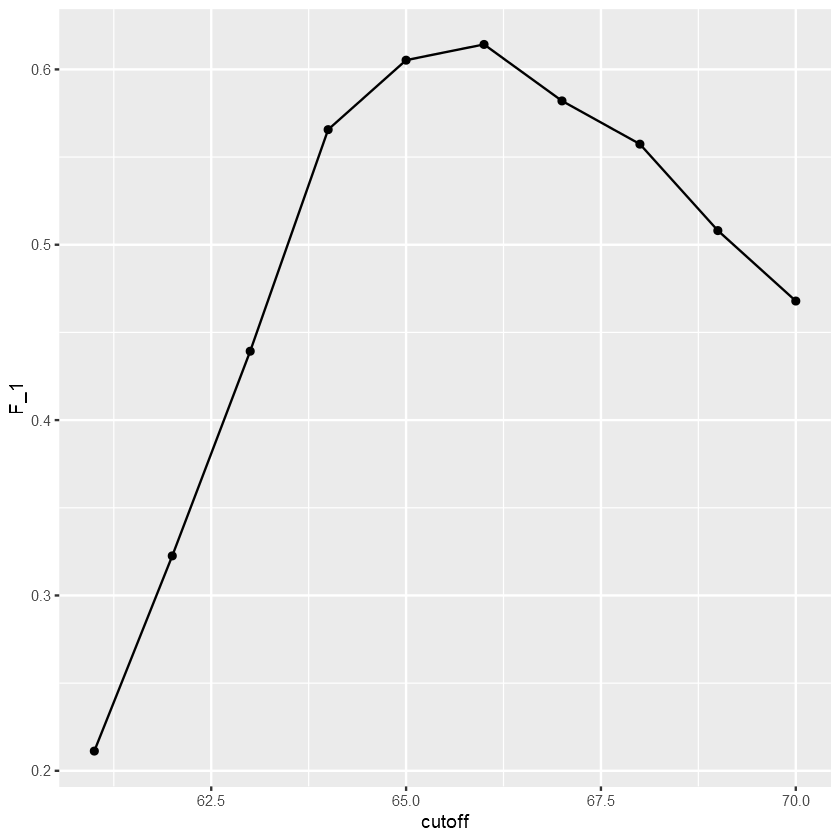

In [57]:
# maximize F-score
cutoff <- seq(61, 70)
F_1 <- map_dbl(cutoff, function(x){
  y_hat <- ifelse(train_set$height > x, "Male", "Female") %>% 
    factor(levels = levels(test_set$sex))
  F_meas(data = y_hat, reference = factor(train_set$sex))
})

data.frame(cutoff, F_1) %>% 
  ggplot(aes(cutoff, F_1)) + 
  geom_point() + 
  geom_line()

max(F_1)

best_cutoff <- cutoff[which.max(F_1)]
best_cutoff

y_hat <- ifelse(test_set$height > best_cutoff, "Male", "Female") %>% 
  factor(levels = levels(test_set$sex))
sensitivity(data = y_hat, reference = test_set$sex)
specificity(data = y_hat, reference = test_set$sex)

[1] 0.7180952

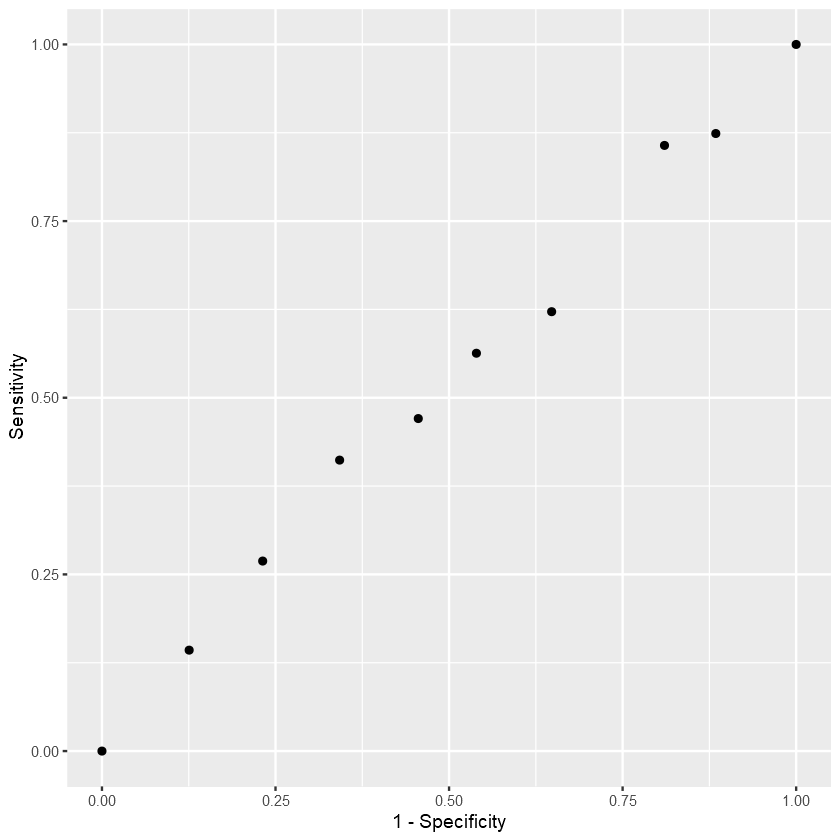

Warning message:
"package 'ggrepel' was built under R version 3.6.3"Warning message in read.dcf(file.path(p, "DESCRIPTION"), c("Package", "Version")):
"cannot open compressed file 'C:/Users/asus/anaconda3/envs/r-tutorial/Lib/R/library/ggplot2/DESCRIPTION', probable reason 'No such file or directory'"

ERROR: Error: package 'ggplot2' required by 'ggrepel' could not be found


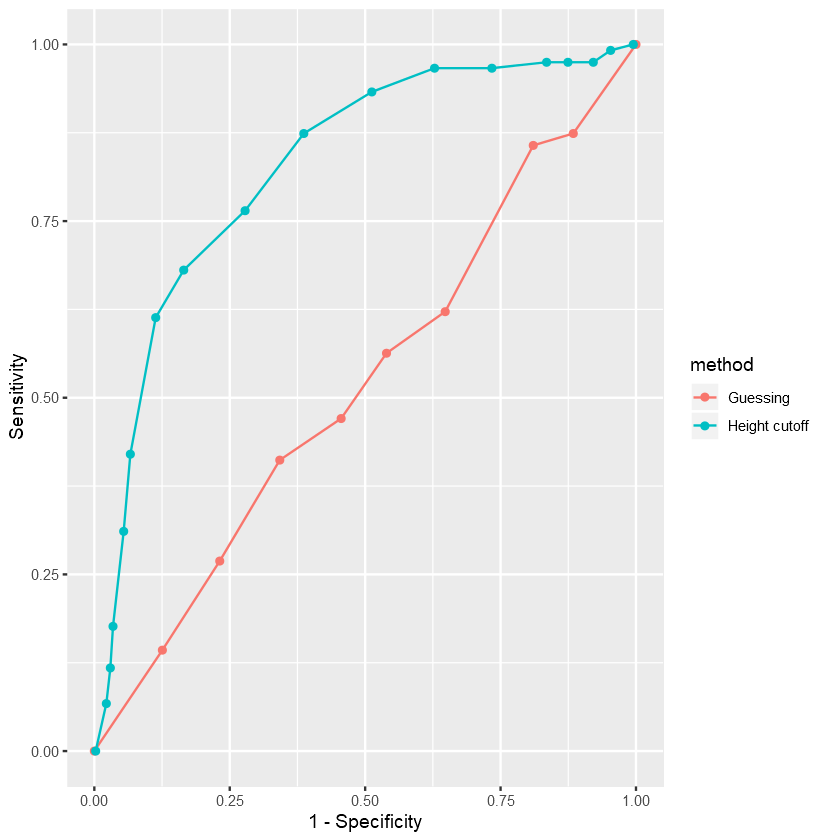

In [59]:
p <- 0.9
n <- length(test_index)
y_hat <- sample(c("Male", "Female"), n, replace = TRUE, prob=c(p, 1-p)) %>% 
  factor(levels = levels(test_set$sex))
mean(y_hat == test_set$sex)

# ROC curve
probs <- seq(0, 1, length.out = 10)
guessing <- map_df(probs, function(p){
  y_hat <- 
    sample(c("Male", "Female"), n, replace = TRUE, prob=c(p, 1-p)) %>% 
    factor(levels = c("Female", "Male"))
  list(method = "Guessing",
       FPR = 1 - specificity(y_hat, test_set$sex),
       TPR = sensitivity(y_hat, test_set$sex))
})
guessing %>% qplot(FPR, TPR, data =., xlab = "1 - Specificity", ylab = "Sensitivity")

cutoffs <- c(50, seq(60, 75), 80)
height_cutoff <- map_df(cutoffs, function(x){
  y_hat <- ifelse(test_set$height > x, "Male", "Female") %>% 
    factor(levels = c("Female", "Male"))
   list(method = "Height cutoff",
        FPR = 1-specificity(y_hat, test_set$sex),
        TPR = sensitivity(y_hat, test_set$sex))
})

# plot both curves together
bind_rows(guessing, height_cutoff) %>%
  ggplot(aes(FPR, TPR, color = method)) +
  geom_line() +
  geom_point() +
  xlab("1 - Specificity") +
  ylab("Sensitivity")

library(ggrepel)
map_df(cutoffs, function(x){
  y_hat <- ifelse(test_set$height > x, "Male", "Female") %>% 
    factor(levels = c("Female", "Male"))
   list(method = "Height cutoff",
        cutoff = x, 
        FPR = 1-specificity(y_hat, test_set$sex),
        TPR = sensitivity(y_hat, test_set$sex))
}) %>%
  ggplot(aes(FPR, TPR, label = cutoff)) +
  geom_line() +
  geom_point() +
  geom_text_repel(nudge_x = 0.01, nudge_y = -0.01)

# plot precision against recall
guessing <- map_df(probs, function(p){
  y_hat <- sample(c("Male", "Female"), length(test_index), 
                  replace = TRUE, prob=c(p, 1-p)) %>% 
    factor(levels = c("Female", "Male"))
  list(method = "Guess",
    recall = sensitivity(y_hat, test_set$sex),
    precision = precision(y_hat, test_set$sex))
})

height_cutoff <- map_df(cutoffs, function(x){
  y_hat <- ifelse(test_set$height > x, "Male", "Female") %>% 
    factor(levels = c("Female", "Male"))
  list(method = "Height cutoff",
       recall = sensitivity(y_hat, test_set$sex),
    precision = precision(y_hat, test_set$sex))
})

bind_rows(guessing, height_cutoff) %>%
  ggplot(aes(recall, precision, color = method)) +
  geom_line() +
  geom_point()
guessing <- map_df(probs, function(p){
  y_hat <- sample(c("Male", "Female"), length(test_index), replace = TRUE, 
                  prob=c(p, 1-p)) %>% 
    factor(levels = c("Male", "Female"))
  list(method = "Guess",
    recall = sensitivity(y_hat, relevel(test_set$sex, "Male", "Female")),
    precision = precision(y_hat, relevel(test_set$sex, "Male", "Female")))
})

height_cutoff <- map_df(cutoffs, function(x){
  y_hat <- ifelse(test_set$height > x, "Male", "Female") %>% 
    factor(levels = c("Male", "Female"))
  list(method = "Height cutoff",
       recall = sensitivity(y_hat, relevel(test_set$sex, "Male", "Female")),
    precision = precision(y_hat, relevel(test_set$sex, "Male", "Female")))
})
bind_rows(guessing, height_cutoff) %>%
  ggplot(aes(recall, precision, color = method)) +
  geom_line() +
  geom_point()